In [1]:
## Imports
import sys
import os
import time
import math
import random

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Plotting import
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Import the utils for plotting the metrics
from plot_utils import plot_utils
from plot_utils import notebook_utils_2

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

In [2]:
from mpl_toolkits.mplot3d import Axes3D

import random
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, DivergingNorm
from mpl_toolkits.axes_grid1 import ImageGrid

In [3]:
# Label dict
label_dict = {0:"gamma", 1:"e", 2:"mu"}

# Fix the colour scheme for each particle type
color_dict = {"gamma":"red", "e":"blue", "mu":"green"}

# Fix the numpy seed
np.random.seed(42)

In [4]:
def plot_log(dump_dirs, model_ids, model_cls, keys, lgd_loc=(0.8,0.5), val=False, log=False, show=False, save_path=None):
    """Generic method for plotting the logs for any model
    
    Args:
    dump_dirs -- Dumps directories for each run
    model_ids -- Names of the models for which the log is being plotted
    model_cls -- Two colors for each model for one axis on each size of the plot
    keys      -- Two keys for columns in the dataframe to plot
    log       -- Boolean to determine whether to use (log scaling) or not
    lgd_loc   -- Tuple to determine the location of the legend
    show      -- Boolean to determine whether to call plt.show()
    save_path -- Absolute path of the location at which to save the plot
    """
    
    # Defensive assertions to prevent Nonetype error
    assert dump_dirs is not None
    assert model_ids is not None
    assert model_cls is not None
    
    # Defensive assertion to prevent breaking function usage
    assert len(dump_dirs) == len(model_ids)
    assert len(model_ids) == len(model_cls)
    assert len(keys) == 2
    
    # Extract the values stored in the .csv files
    train_epochs = []
    val_epochs = []
    
    train_0 = []
    train_1 = []
    
    val_0 = []
    val_1 = []
    
    dump_dirs = ["/home/akajal/WatChMaL/VAE/dumps/" + dump_dir + "/" for dump_dir in dump_dirs]
    
    # Iterate over the logs for all the models
    for dump_dir in dump_dirs:
        
        train_log_path = dump_dir + "log_train.csv"
        val_log_path = dump_dir + "log_val.csv"
        
        if os.path.exists(train_log_path) and os.path.exists(val_log_path):
            train_log_df = pd.read_csv(train_log_path, usecols=["epoch",keys[0],keys[1]])
            if val:
                val_log_df = pd.read_csv(val_log_path, usecols=["epoch",keys[0],keys[1]])
            
        train_epochs.append(train_log_df["epoch"].values)
        train_0.append(train_log_df[keys[0]].values)
        train_1.append(train_log_df[keys[1]].values)
        
        if val:
            val_epochs.append(val_log_df["epoch"].values)
            val_0.append(val_log_df[keys[0]].values)
            val_1.append(val_log_df[keys[1]].values)
     
    # Initialize the plot
    fig, ax1 = plt.subplots(figsize=(16,11))
    ax2 = ax1.twinx()
    
    # Print the mpl rcParams
    mpl.rcParams['agg.path.chunksize']=1e12
    
    # Reload the backend
    mpl.use(mpl.get_backend())
    
    for i, model_ids in enumerate(model_ids):
        if val:
            ax1.plot(train_epochs[i], train_0[i], color=model_cls[i][0], alpha=0.3, linewidth=1.0)
            ax2.plot(train_epochs[i], train_1[i], color=model_cls[i][1], alpha=0.3, linewidth=1.0)
            
            ax1.plot(val_epochs[i], val_0[i], color=model_cls[i][0], label=model_ids+" "+keys[0], alpha=1.0,
                     linewidth=1.0)
            ax2.plot(val_epochs[i], val_1[i], color=model_cls[i][1], label=model_ids+" "+keys[1], alpha=1.0,
                     linewidth=1.0)
        else:
            ax1.plot(train_epochs[i], train_0[i], color=model_cls[i][0], label=model_ids+" "+keys[0],
                     alpha=0.3, linewidth=1.0)
            ax2.plot(train_epochs[i], train_1[i], color=model_cls[i][1], label=model_ids+" "+keys[1],
                     alpha=0.3, linewidth=1.0)
    
    if log:
        ax1.set_yscale("log")
        ax2.set_yscale("log")
    
    # Setup plot characteristics
    ax1.tick_params(axis="x", labelsize=30)
    ax1.set_xlabel("Epoch", fontsize=30)
    
    ax1.set_ylabel(keys[0], fontsize=30, color=model_colors[0][0])
    ax1.tick_params(axis="y", labelsize=30, color=model_colors[0][0])
    
    ax2.set_ylabel(keys[1], fontsize=30, color=model_colors[0][1])
    ax2.tick_params(axis="y", labelsize=30, color=model_colors[0][1])
    
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    
    lgd = plt.legend(lines1 + lines2, labels1 + labels2, prop={"size":30},
                     loc="upper right", bbox_to_anchor=lgd_loc, frameon=True,
                     fancybox=True, shadow=True, framealpha=1.0)
    
    ax1.grid(True, which="both", axis="both")
    ax2.grid(True, which="both", axis="both")
    
    plt.margins(0.2)
    
    if save_path is not None:
        plt.savefig(save_path, format='pdf', dpi=600, bbox_extra_artists=(lgd))
    if show:
        try:
            plt.show()
        except:
            print("plot_log() : Unable to render the plot" 
                  + " due to limits on \'agg.path.chunksize\')")
            if save_path is None:
                print("plot_log() : Saving plot to ./{0}".format("vae_training_log.pdf"))
                plt.savefig("vae_training_log.eps", format='pdf', dpi=600, bbox_extra_artists=(lgd))
            plt.clf()
            plt.close()
    else:
        plt.clf()
        plt.close()

### Fully supervised classifiers trained for 10.0 epochs on the entire dataset

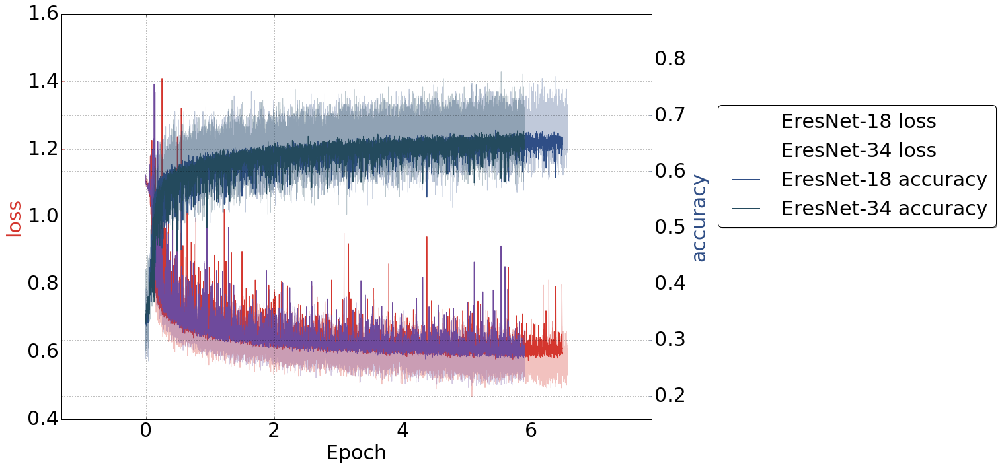

In [6]:
run_ids = ["20191029_163235", "20191029_163429"]
model_ids = ["EresNet-18", "EresNet-34"]

model_colors = [(np.random.rand(3,), np.random.rand(3,)) for model in model_ids]
keys = ["loss", "accuracy"]

plot_log(run_ids, model_ids, model_colors, keys, lgd_loc=(1.6, 0.8), val=True, log=False, show=True)

### Unsupervised VAE trained for 10.0 epochs on the entire dataset (using beta annealing)

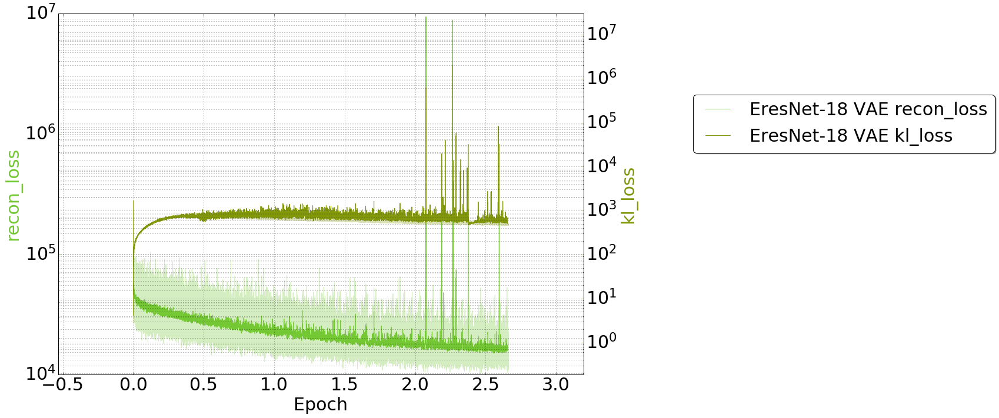

In [84]:
run_ids = ["20191026_050636"]
model_ids = ["EresNet-18 VAE"]

model_colors = [(np.random.rand(3,), np.random.rand(3,)) for model in model_ids]
keys = ["recon_loss", "kl_loss"]

plot_log(run_ids, model_ids, model_colors, keys, lgd_loc=(1.8, 0.8), val=True, log=True, show=True)

### Unsupervised VAE trained for 10.0 epochs on the entire dataset (without beta annealing)

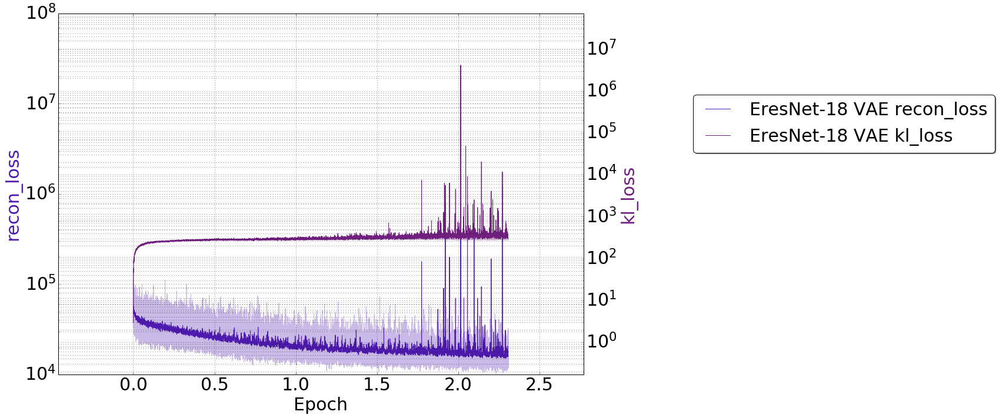

In [86]:
run_ids = ["20191026_115826"]
model_ids = ["EresNet-18 VAE"]

model_colors = [(np.random.rand(3,), np.random.rand(3,)) for model in model_ids]
keys = ["recon_loss", "kl_loss"]

plot_log(run_ids, model_ids, model_colors, keys, lgd_loc=(1.8, 0.8), val=True, log=True, show=True)

## Plotting new event displays

In [24]:
# 10x10 square represents one mPMT
# List of top-left pixel positions (row,col) for 2x2 grids representing PMTs 0 to 18
POS_MAP = [(8,4), #0
           (7,2), #1
           (6,0), #2
           (4,0), #3
           (2,0), #4
           (1,1), #5
           (0,4), #6
           (1,6), #7
           (2,8), #8
           (4,8), #9
           (6,8), #10
           (7,6), #11
           # Inner ring
           (6,4), #12
           (5,2), #13
           (3,2), #14
           (2,4), #15
           (3,6), #16
           (5,6), #17
           (4,4)] #18

PADDING = 0

def get_plot_array(event_data):
    
    # Assertions on the shape of the data and the number of input channels
    assert(len(event_data.shape) == 3 and event_data.shape[2] == 19)
    
    # Extract the number of rows and columns from the event data
    rows = event_data.shape[0]
    cols = event_data.shape[1]
    
    # Make empty output pixel grid
    output = np.zeros(((10+PADDING)*rows, (10+PADDING)*cols))
    
    i, j = 0, 0
    
    for row in range(rows):
        j = 0
        for col in range(cols):
            pmts = event_data[row, col]
            tile(output, (i, j), pmts)
            j += 10 + PADDING
        i += 10 + PADDING
        
    return output
            
def tile(canvas, ul, pmts):
    
    # First, create 10x10 grid representing single mpmt
    mpmt = np.zeros((10, 10))
    for i, val in enumerate(pmts):
        mpmt[POS_MAP[i][0]][POS_MAP[i][1]] = val

    # Then, place grid on appropriate position on canvas
    for row in range(10):
        for col in range(10):
            canvas[row+ul[0]][col+ul[1]] = mpmt[row][col]

In [25]:
# Plot the reconstructed vs actual events
def plot_actual_vs_recon(run_ids, show_plot=False, save_path=None):
    
    dump_path = "/home/akajal/WatChMaL/VAE/dumps/"
    dump_dirs = [dump_path + run_id + "/" for run_id in run_ids]
    
    np_arr_paths = [dump_dir + "trained_interpolations.npz" for dump_dir in dump_dirs]

    # Load the np array into memory
    np_arrs = [np.load(np_arr_path) for np_arr_path in np_arr_paths]
    print("Loaded the npz array. Keys = ", list(np_arrs[0].keys()))
    
    
    # Extract the actual interpolated events
    np_samples = [np_arr["samples"][0] for np_arr in np_arrs]
    print("npz sample array shapes :", np_samples[0].shape)

    np_events = [np_arr["events_1"] for np_arr in np_arrs]
    print("npz actual event array shapes :", np_events[0].shape)
    
    # Initialize the figure to plot the events
    fig = plt.figure(figsize=((40*len(run_ids))/1.5, (17*2)/1.5))
    
    grid = ImageGrid(fig, 111, nrows_ncols=(2,len(run_ids)),
                     axes_pad=0.15, share_all=True)#, cbar_location="right", cbar_mode="single",
                     #cbar_size="3%", cbar_pad=0.30)
    
    # Setup the plot
    ratio=0.8
    dvgnorm = DivergingNorm(vcenter=0.1)
    
    colors1 = plt.cm.bone(np.linspace(0, 0.5, math.ceil((1.0-ratio)*1024)))
    colors2 = plt.cm.afmhot(np.linspace(0., 1, math.floor(ratio*1024)))
    colors = np.vstack((colors1, colors2))
    
    dvgnorm = DivergingNorm(vcenter=0.1)
    mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)
    
    np_events = np.array(np_events).reshape(-1,16,40,19)
    np_samples = np.array(np_samples).reshape(-1,16,40,19)
    
    # Plot the inpterpolated events
    ims = []
    j = 0
    
    for i,axe in enumerate(grid):
        if j is 0:
            ims.append(axe.imshow(get_plot_array(np_events[i]), origin="upper", cmap=mymap, norm=dvgnorm,
                                  clim=(0, 10.0)))
            axe.get_xaxis().set_visible(False)
            axe.get_yaxis().set_visible(False)
        else:
            ims.append(axe.imshow(get_plot_array(np_samples[i-np_events.shape[0]]), origin="upper", cmap=mymap, norm=dvgnorm,
                                  clim=(0, 10.0)))
            axe.get_xaxis().set_visible(False)
            axe.get_yaxis().set_visible(False)
            
        if i == np_events.shape[0]-1:
            j = 1
            
    
    #cbar = fig.colorbar(ims[0], ax=axes.ravel().tolist(), extend="both")
    #cbar.set_label(r"Charge, $c$", fontsize=100)
    #cbar.ax.tick_params(labelsize=100)
    # Colorbar
    #cbar = fig.colorbar(ims[0], cax=axe.cax, orientation='vertical', extend='both')
    #cbar.set_label(r"Charge, $c$", fontsize=75)
    #cbar.ax.tick_params(labelsize=75)
    #axe.cax.toggle_label(True)
        
    if save_path is not None:
        plt.savefig("figures/"+save_path, format="pdf", dpi=30, bbox_inches="tight")
    
    if show_plot:
        plt.show()
    else:
        plt.clf() # Clear the plot frame
        plt.close() # Close the opened window if any

In [87]:
run_id = "20191028_101204"
dump_path = "/home/akajal/WatChMaL/VAE/dumps/"
dump_dir = dump_path + run_id + "/"

np_arr_path = dump_dir + "test_validation_iteration_dump.npz"
np_arr = np.load(np_arr_path)
print("Loaded the npz array. Keys = ", list(np_arr.keys()))

Loaded the npz array. Keys =  ['events', 'labels', 'energies', 'recon', 'z', 'mu', 'logvar']


In [88]:
np_actual = np_arr["events"]
print("npz actual array shape :", np_actual.shape)

np_recon = np_arr["recon"]
print("npz recon array shape :", np_recon.shape)

npz actual array shape : (768, 40, 40, 19)
npz recon array shape : (768, 40, 40, 19)


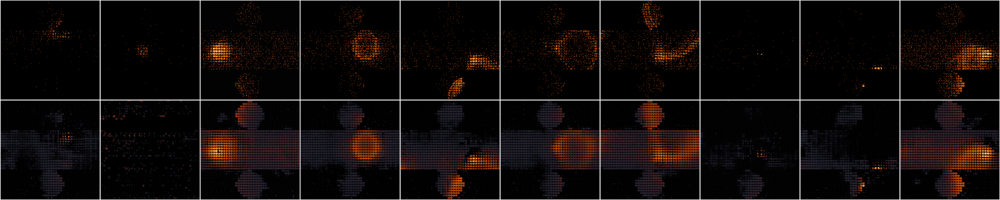

In [90]:
# Initialize the figure to plot the events
fig = plt.figure(figsize=((40*len(run_ids)*5), 40*len(run_ids)*5))

grid = ImageGrid(fig, 111, nrows_ncols=(2, len(run_ids)*10),
                 axes_pad=0.15, share_all=True)#, cbar_location="right", cbar_mode="single",
                 #cbar_size="3%", cbar_pad=0.30)

# Setup the plot
ratio=0.8
dvgnorm = DivergingNorm(vcenter=0.1)

colors1 = plt.cm.bone(np.linspace(0, 0.5, math.ceil((1.0-ratio)*1024)))
colors2 = plt.cm.afmhot(np.linspace(0., 1, math.floor(ratio*1024)))
colors = np.vstack((colors1, colors2))

dvgnorm = DivergingNorm(vcenter=0.1)
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

j = 0

for i in range(0, int(len(grid)/2), 1):
    actual_axe = grid[i]
    recon_axe  = grid[i+int(len(grid)/2)]
    
    i = random.randint(0, np_actual.shape[0]-1)
    ims.append(actual_axe.imshow(get_plot_array(np_actual[i]), origin="upper", cmap=mymap, norm=dvgnorm, 
                                 clim=(0, 10.0)))
    ims.append(recon_axe.imshow(get_plot_array(np_recon[i]), origin="upper", cmap=mymap, norm=dvgnorm,
                                clim=(0, 10.0)))
        
    actual_axe.get_xaxis().set_visible(False)
    actual_axe.get_yaxis().set_visible(False)
    
    recon_axe.get_xaxis().set_visible(False)
    recon_axe.get_yaxis().set_visible(False)